# Functional analysis of gene signatures

In this session we will analyze the differentially expressed genes found by DESeq2 on the bulk RNA-seq data, for the p53 case study. Two replicates of non-stimulated (NS) RNA-seq samples were compared with 2 replicates of stimulated (S) RNA-seq samples. 

The DESeq2 analysis resulted in a deseq.results.tsv file, which we will use here.
The Seurat analysis of scRNA-seq data ...
The Scanpy analysis of scRNA-seq data ...

In [4]:
mkdir -p /mnt/storage/$USER/jupyternotebooks/functional_analysis_gene_signatures/
cd /mnt/storage/$USER/jupyternotebooks/functional_analysis_gene_signatures/

In [5]:
ln -sf /mnt/storage/data/RNA-seq/GSE47042/deseq.results.tsv .

In [6]:
head deseq.results.tsv

Gene	baseMean	log2FoldChange	lfcSE	stat	pvalue	padj
PLK1	2169.89887036599	-4.66219867916598	0.133635353659893	-34.8874646677065	1.15177059571362e-266	1.68388861093331e-262
CDKN1A	25241.2080295721	4.42457936561409	0.129633158756298	34.1315401712306	2.5125839341367e-255	1.83669885585392e-251
CDC20	2087.37990872435	-4.40177745450003	0.130177472157127	-33.8136651569558	1.24205653171511e-250	6.05295549789164e-247
TP53INP1	3332.81998084826	4.14308467439012	0.12651543848487	32.7476608705394	3.27820954642684e-235	1.19818558921901e-231
CCNA2	1833.68494342593	-4.58742887189172	0.141728770920042	-32.3676614290247	7.82962634244032e-230	2.28938274252955e-226
KIF20A	2304.20076082827	-4.59980047267874	0.142632224344441	-32.2493776831997	3.58935101133231e-228	8.74605196427972e-225
HMGB2	2441.5235956432	-3.64481763157341	0.121698431532697	-29.9495859204572	4.4548629638111e-197	9.3042995044169e-194
PRC1	3467.82739378419	-3.21578273306019	0.107728899485699	-29.8506969662961	8.59778727441137e-196	1.571245

In [7]:
ls

deseq.logFC.rnk              deseq.results.sortFCdesc.txt  down-logFC1-p05.txt
deseq.results.sortFCasc.txt  deseq.results.tsv             up-logFC1-p05.txt


You can edit your own deseq.results.tsv file to add Gene in the first column as header. You can do this on the server using emacs, or in the Jupyter text editor, or locally in your Notepad++ or TextWrangler on your PC.
Here is my edited version:


In [34]:
head deseq.results.tsv

Gene	baseMean	log2FoldChange	lfcSE	stat	pvalue	padj
RP11-34P13.15	11.5482533693983	0.515905710144347	0.388237232309217	1.33396987809999	0.18221372853816	0.320141074047509
RP11-34P13.18	14.3479957697024	-0.322318555156548	0.39106530144887	-0.826716482614408	0.408397776835734	0.572713929316466
MTND2P28	1553.53501095406	0.345901561209681	0.12848655664732	2.69211265227074	0.00710009581932222	0.0222522790415379
MTCO1P12	432.681475568808	0.590828819367065	0.161280800121173	3.66276926807822	0.000249503259518923	0.0011785142092054
MTCO2P12	51.4470121161029	0.434069724550713	0.328277674945307	1.32154232856144	0.186320598480368	0.325631454392896
MTATP6P1	3619.24176774161	0.26602655180733	0.102997065592415	2.58285352243885	0.00979869151064095	0.029307698509279
MTCO3P12	20.7060554939776	0.0656697691984809	0.385650910625019	0.170304942889763	0.864770324184405	0.926028524747215
RP11-206L10.2	18.9162613883412	-0.265820506219559	0.387781096117732	-0.685101672092888	0.493279765193069	0.65167460389603
R

In [35]:
head -1 deseq.results.tsv
grep -n CDKN1A deseq.results.tsv
grep -n BBC3 deseq.results.tsv
grep -n GDF15 deseq.results.tsv

Gene	baseMean	log2FoldChange	lfcSE	stat	pvalue	padj
5115:CDKN1A	26709.0271272243	4.35529710361006	0.129379733603953	33.6459640371292	3.57186974351078e-248	1.89523408590682e-244
14063:BBC3	617.233515982886	2.51981984077671	0.191307830362928	13.1200590524367	2.52737927785454e-39	1.3500276290231e-37
13651:GDF15	5243.23204094422	2.87257343137785	0.365403011766465	8.07100607830253	6.97212456294088e-16	1.36007694599134e-14


Some of the known targets are strongly up-regulated (logFC > 2) and p.adj << 0.05

## Use arbitrary thresholds to create lists of up- and down-regulated genes
* careful: there are a lot of genes without detected expression, they have NA in the logFC column; so column 3 ($3) should not be "NA" 
* we're using awk to filter this file, selecting only rows where the logFC (column 3, indicated by "\$3") is higher than a threshold; and the padj is lower than a threshold
* print ; => prints all the columns of the rows that fulfill our requirements

In [36]:
awk '$3 != "NA" && $3 > 1 && $7 < 0.05 {print ;}' deseq.results.tsv | head

TNFRSF14	39.2335304890175	1.78688641373721	0.365972446523314	4.7713619473988	1.82984378787057e-06	1.31738821417113e-05
HES2	460.968697025486	2.65672875645476	0.183533564887482	14.3799590905435	6.91354080270908e-47	4.33266702746154e-45
ERRFI1	1647.82799122943	1.14988653720085	0.129403935746188	8.88421949790367	6.43710852681323e-19	1.5362202928008e-17
MIR34AHG	249.852839701279	1.86199984019952	0.216155641478437	8.57609199028742	9.81510574571426e-18	2.17908083089234e-16
LINC01759	42.942968992871	2.1464078434104	0.358935707559511	5.73629015844426	9.67728163075752e-09	9.73722939307195e-08
FBXO44	196.787606855431	1.13722807106559	0.216502758301356	5.24346399398118	1.57589573357352e-07	1.34866173586147e-06
DRAXIN	35.1837969404171	2.18830981440632	0.380995703733686	5.42372564472878	5.83694496826824e-08	5.2671479594611e-07
FBLIM1	64.1010293488792	1.21712766697139	0.317115166749617	3.81701324618945	0.000135076920848608	0.000677213992462408
MST1P2	12.2329542929757	1.02582833931306	0.3874258099069

Now print only the first column with the gene names

In [37]:
awk '$3 != "NA" && $3 > 1 && $7 < 0.05 {print $1}' deseq.results.tsv | head

TNFRSF14
HES2
ERRFI1
MIR34AHG
LINC01759
FBXO44
DRAXIN
FBLIM1
MST1P2
PADI3


Write that to a file

In [38]:
awk '$3 != "NA" && $3 > 1 && $7 < 0.05 {print $1}' deseq.results.tsv > up-logFC1-p05.txt

Do the same for significantly down-regulated genes

In [39]:
awk '$3 != "NA" && $3 < -1 && $7 < 0.05 {print $1}' deseq.results.tsv > down-logFC1-p05.txt

In [40]:
wc -l up-logFC1-p05.txt
wc -l down-logFC1-p05.txt

814 up-logFC1-p05.txt
760 down-logFC1-p05.txt


## Humanmine.org

Create a new list on humanmine.org, then click "Save List of N genes"
* For mouse genes, use mousemine.org
* For Drosophila genes, use flymine.org
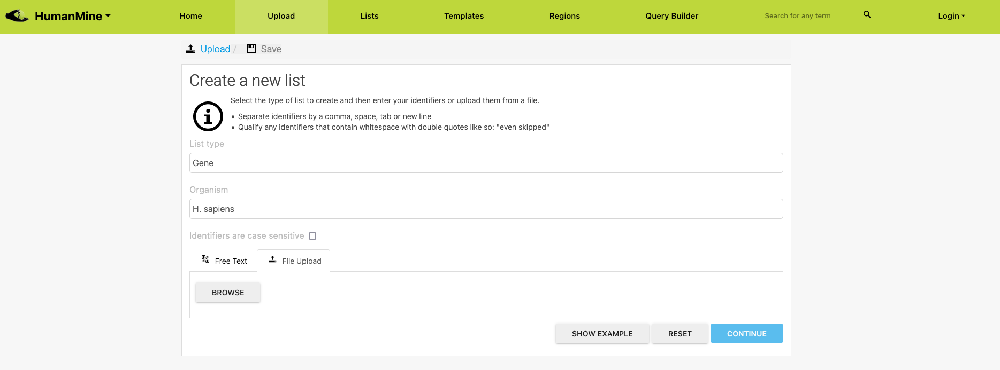

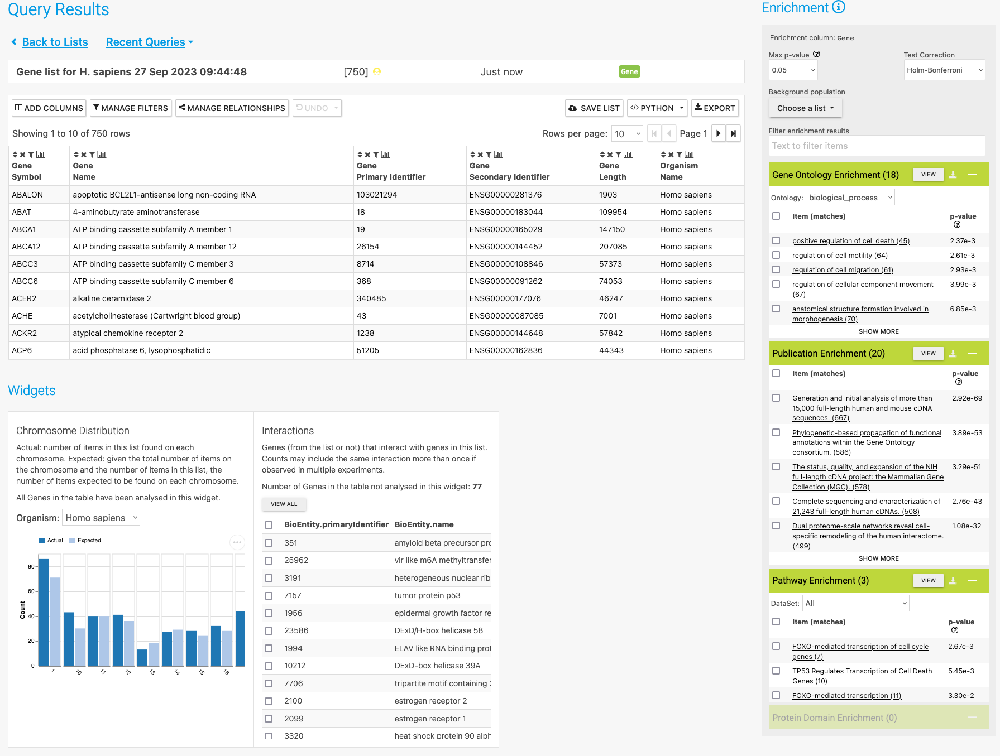

* Pathway enrichment shows that the TP53 regulation of cell death genes transcription is enriched, good! This means among the up-regulated genes are a significant number of genes that are known to be regulated by TP53 and are involved in cell death.
* From GO we can see that positive regulation of cell death is enriched, which is also expected.
* From the other widgets, we don't really learn much, for the up-regulated genes.

## gProfiler

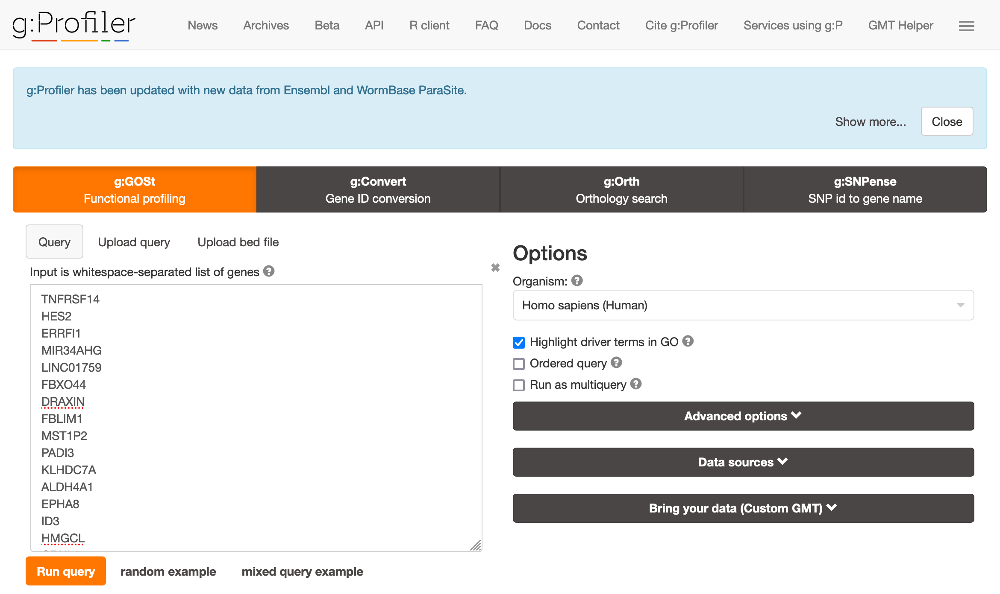

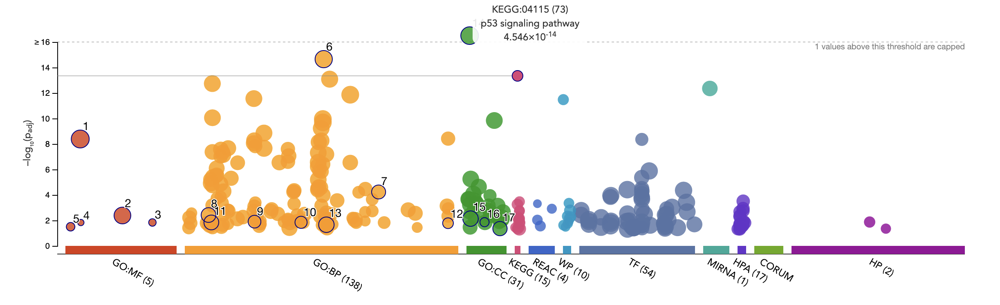

We find significant enrichment of genes involved in the p53 signaling pathway.

## Use the entire ranking to determine the "leading edge"

### GORilla

Sort all genes descending by their logFC or padj; here we use logFC

In [41]:
cat deseq.results.tsv | sort -k 3,3gr | awk '$3 != "NA" {print $1}' | grep -v Gene | head

SERPINB5
SMIM10L2A
CDKN1A
INPP5D
ADAMTS7
GPR87
TP53INP1
CLCA2
ACTA2
COL17A1
grep: write error: Broken pipe
sort: write failed: 'standard output': Broken pipe
sort: write error


In [42]:
cat deseq.results.tsv | sort -k 3,3gr | awk '$3 != "NA" {print $1}' | grep -v Gene > deseq.results.sortFCdesc.txt

Go to http://cbl-gorilla.cs.technion.ac.il/ and enter the text file with ranked gene names, then click on search for enriched GO terms:

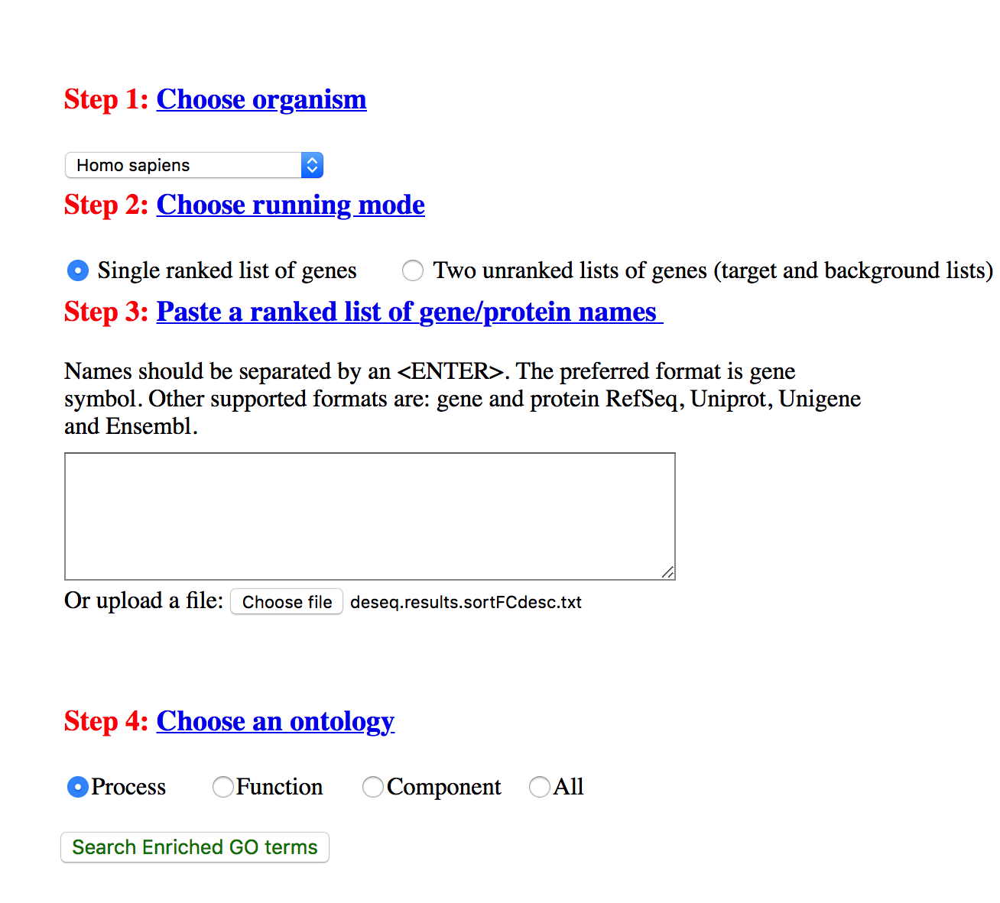

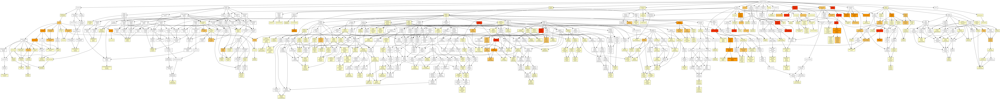

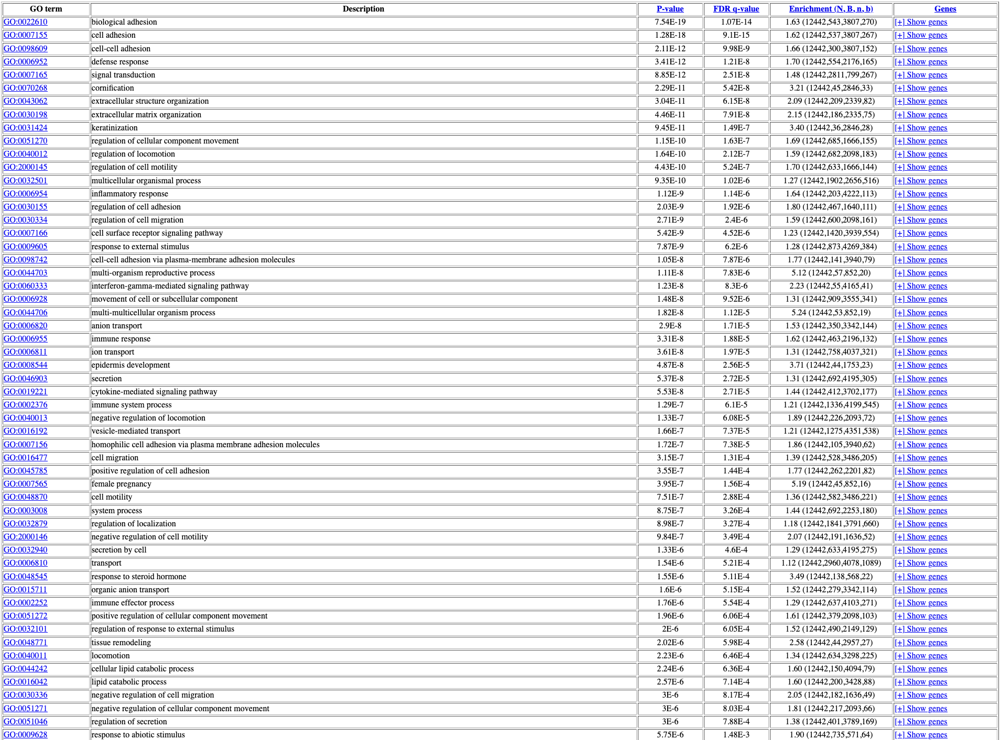

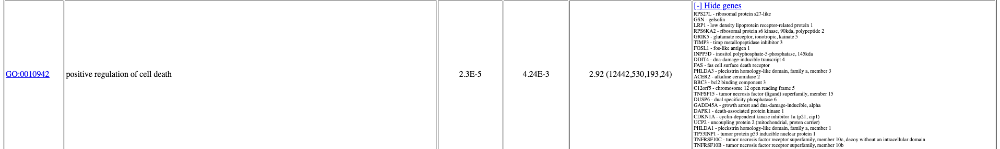

* (12442,530,193,24) => there are 24 genes that are known to be involved in 'positive regulation of cell death'(they are annotated with this GO term or with its child terms), within the top 193 genes; while among all annotated 12442 genes in the human genome, there are 530 genes with this function. The expected frequency is 530/12442 while the observed frequency is 24/193. The latter is significantly higher according to the binomial/hypergeometric distribution, since the adjusted p-value is 0,00932 which is smaller than 0.05.

* The interesting thing about this ranking-based approach, is that the signifance is tested at each threshold. For this particular process, the enrichment is highest at position 193.

* This is called the leading edge.

* If we are interested in how p53 regulates apoptosis, we can choose to use 164 as cutoff, which is more stringent than the arbitrary cutoff applied above.

* However, if we are interested in up-regulation of various metabolic genes, then a cutoff of 1507 genes may be more suited (first enriched term).


Do the same, but now for a ranked list in ascending order (most down-regulated gene on top):

In [44]:
cat deseq.results.tsv | sort -k3,3g | awk '$3 != "NA" {print $1}' | grep -v Gene > deseq.results.sortFCasc.txt

In [45]:
head deseq.results.sortFCasc.txt 

KIF14
PIF1
NEIL3
PLK1
NDC80
CCNA2
KIF20A
CDC20
HMMR
NCAPH


In [46]:
grep -n E2F1 deseq.results.sortFCasc.txt 
grep -n E2F1 deseq.results.sortFCdesc.txt

70:E2F1
15849:E2F1


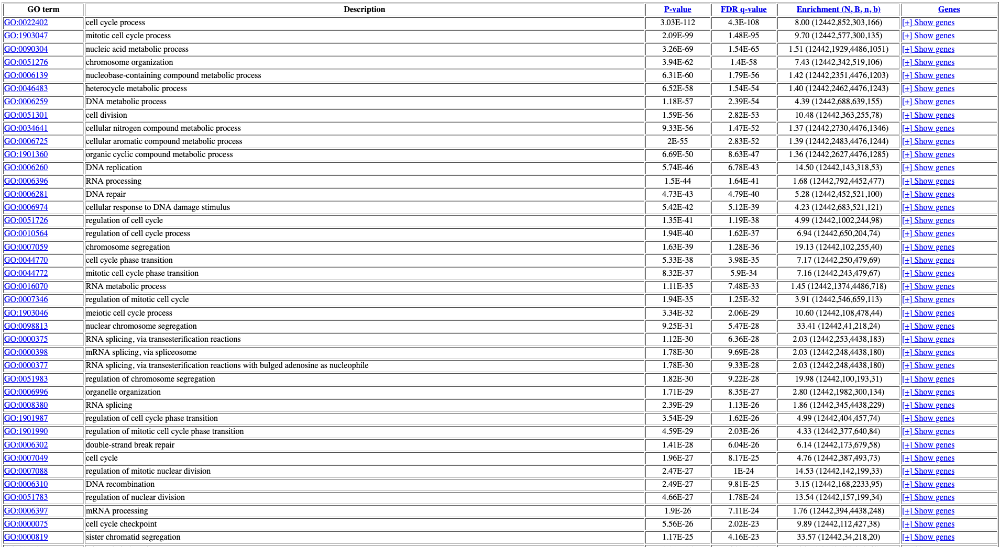

Here we have super-high significance. We also see that cell-cycle related processes lead to a leading edge of around 300-400 genes (so smaller, more stringent, than our arbitrary cutoff above).

### GSEA : Gene Set Enrichment Analysis

(Here we use GSEA, but feel free to explore other tools (e.g., [EnrichR](https://maayanlab.cloud/Enrichr/)).)

GSEA is often used for a ranking-based enrichment analysis. We will use a standalone version of GSEA, which you can download here: http://software.broadinstitute.org/gsea/index.jsp (click on Downloads; but you need to register first).

* GSEA firstly needs file with the ranked genes, as a .rnk file (just a text file with .rnk extension) with 2 columns: the gene name and the logFC value (the value can also be another type of score, here we use the logFC value).
* GSEA also needs a collection of gene lists, such as gene lists representing GO categories, pathways, etc. For human analyses, lots of collections are available from MSigDB. 
* You can also use your own collection of gene sets, then they need to be formatted in a .gmt file format, see https://software.broadinstitute.org/cancer/software/gsea/wiki/index.php/Data_formats
* In the GSEA software, we will use the GSEAPreranked function to test gene signatures against are preranked gene list (the .rnk file).
* An advantage of GSEA is that both the top of the ranking and the bottom will be tested (while GORilla only tests the top of the ranking; for the bottom we had to reverse the ranking)
* It is VERY important to use a ranking of ALL genes that were measured, not of a gene signature !



Let's first generate a .rnk file

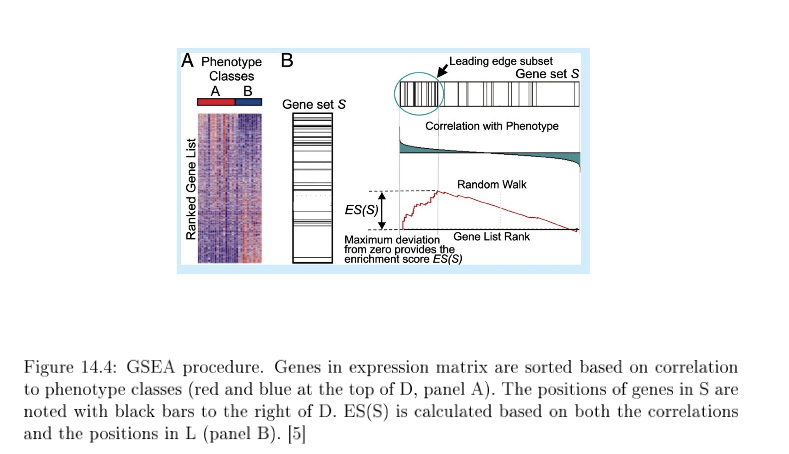

In [47]:
cat deseq.results.tsv | sort -k 3,3gr | awk '$3 != "NA" {print $1, $3}' | grep -v Gene | head

SERPINB5 4.69385680422906
SMIM10L2A 4.35539526180303
CDKN1A 4.35529710361006
INPP5D 4.17471712532692
ADAMTS7 4.12005302365328
GPR87 4.10222137466022
TP53INP1 4.07783843278124
CLCA2 4.01341128108452
ACTA2 3.94398504515221
COL17A1 3.73941158291618
grep: write error: Broken pipe
sort: write failed: 'standard output': Broken pipe
sort: write error


In [48]:
cat deseq.results.tsv | sort -k 3,3gr | awk '$3 != "NA" {print $1, $3}' | grep -v Gene | tr ' ' '\t' > deseq.logFC.rnk

In [49]:
head deseq.logFC.rnk

SERPINB5	4.69385680422906
SMIM10L2A	4.35539526180303
CDKN1A	4.35529710361006
INPP5D	4.17471712532692
ADAMTS7	4.12005302365328
GPR87	4.10222137466022
TP53INP1	4.07783843278124
CLCA2	4.01341128108452
ACTA2	3.94398504515221
COL17A1	3.73941158291618


In the gene set database, we have chosen KEGG pathways.

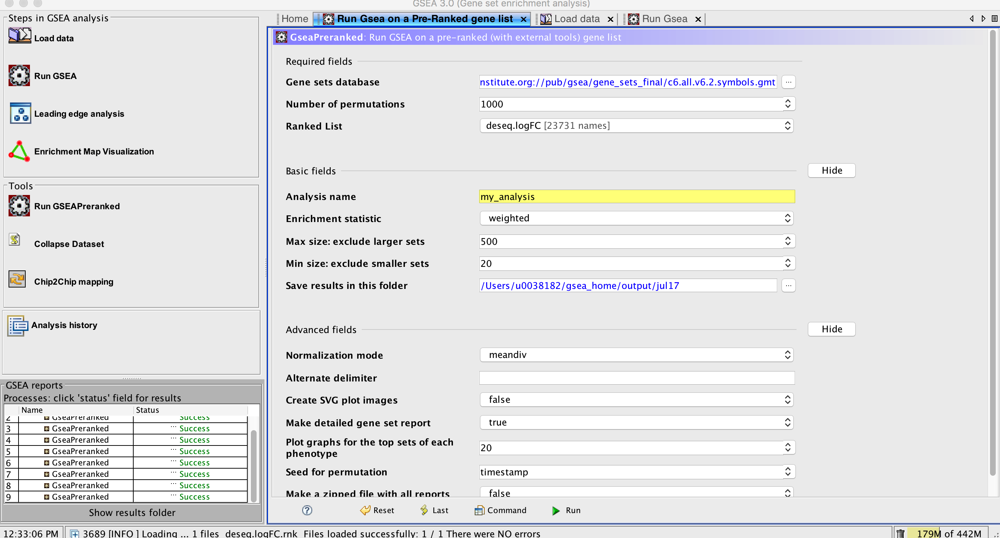

This can take a while. When it's done, click on the "Success". This will open the results in a browser.

Click on the links "enrichment results in HTML""




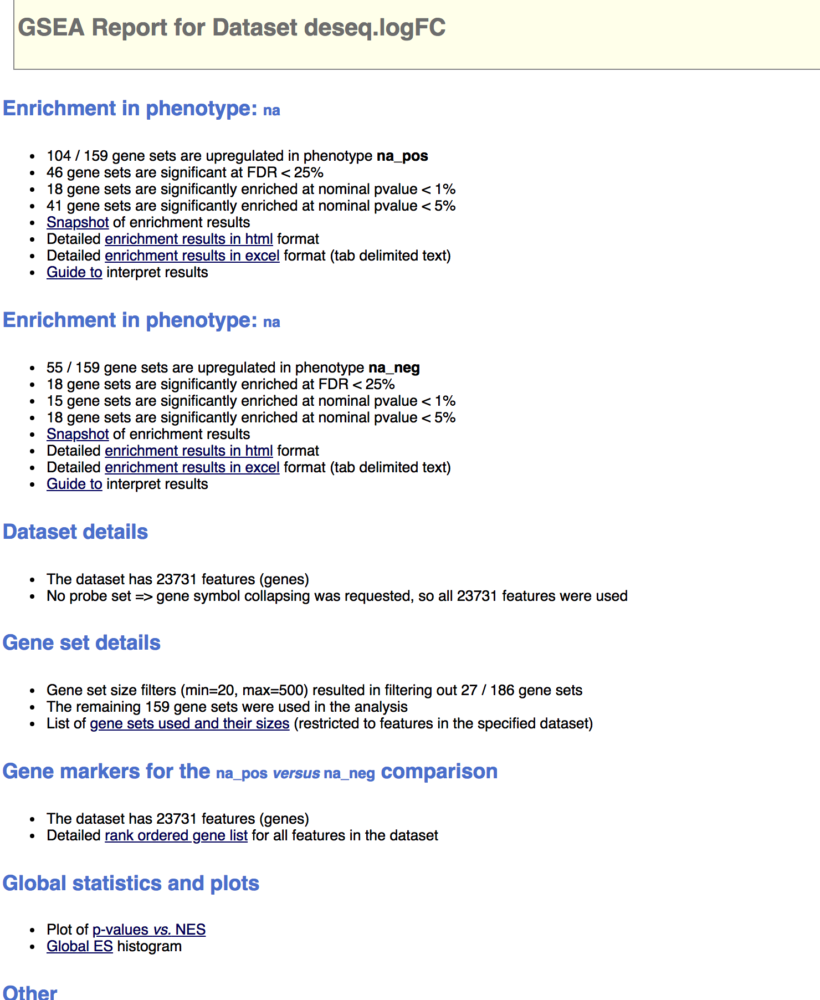

In the bottom part (na_neg), cell cycle pathways are significantly enriched (leading edge 1989).
In the top part (na_pos), the TP53 pathway is enriched (leading edge 780), but apart from that (similarly to the GO analysis), not much can be concluded.

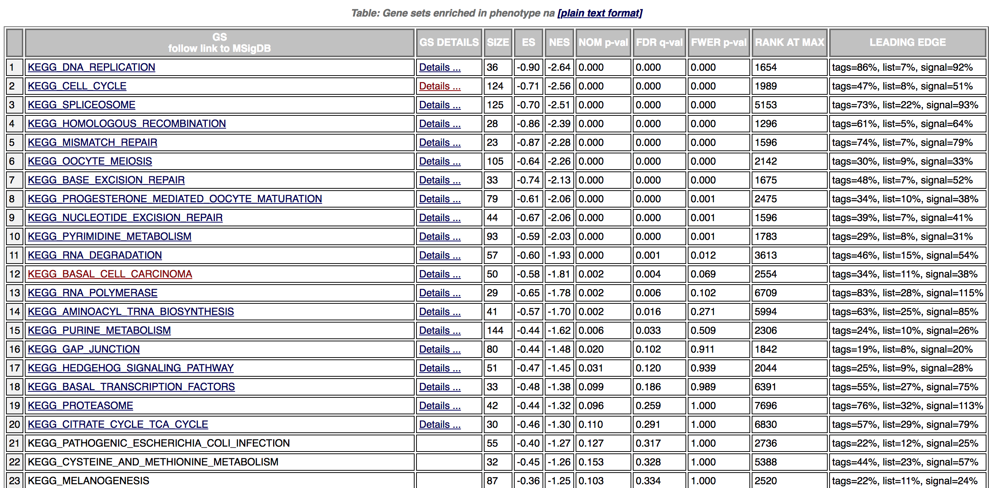

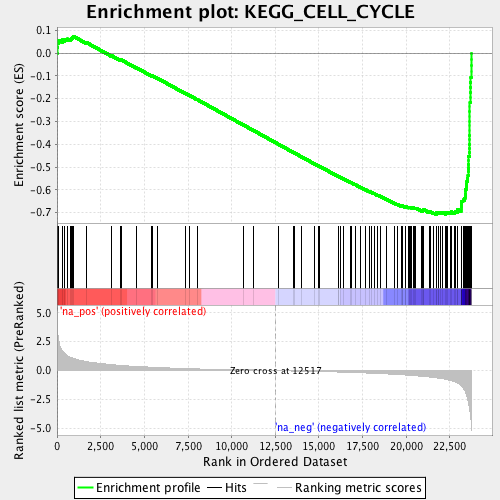

# Motif discovery ; upstream TF identification

Given a set of co-expressed genes, such as all genes significantly up-regulated by p53, can we find enriched transcription factor motifs in the upstream (and intronic, downstream) sequences of this gene set?

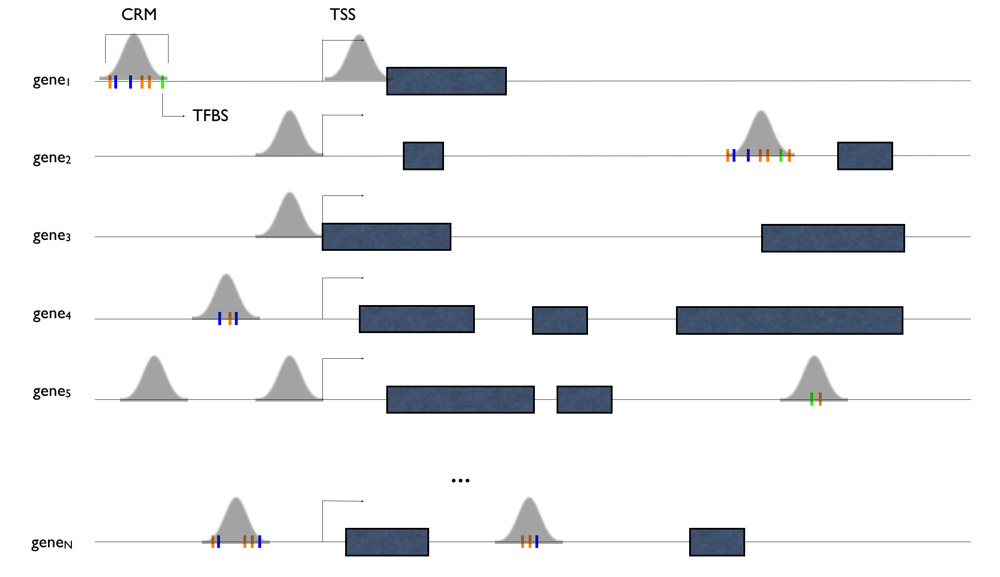

Follow the tutorial of iRegulon: http://iregulon.aertslab.org/tutorial.html

In Cytoscape, do File->Import->Network->File, and choose the text file with all the up-regulated genes.

Choose the gene names as "source node" (there is no target node now). Also turn of the advanced option that the file contains headers in the first row.
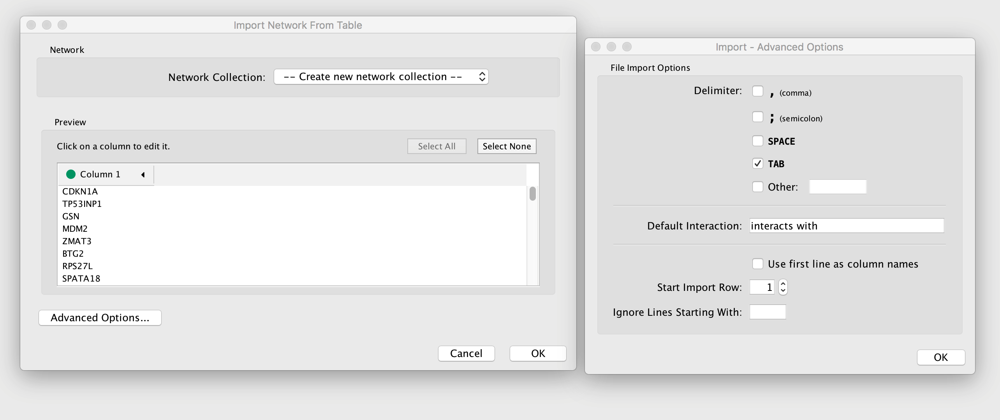

Select all nodes (ctrl-A), then go to Apps, install the iRegulon app, and once installed, run iRegulon with default settings.

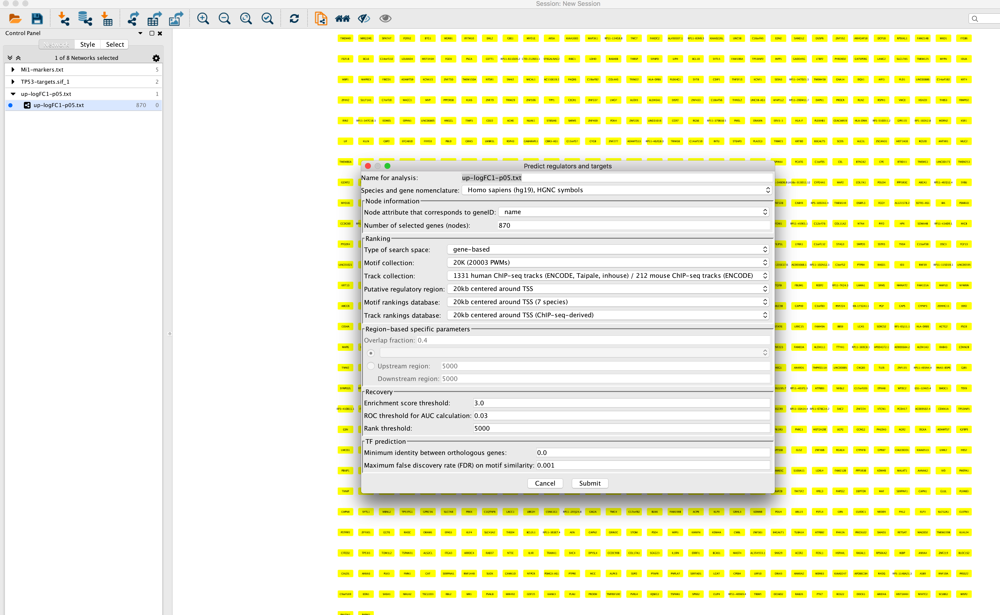

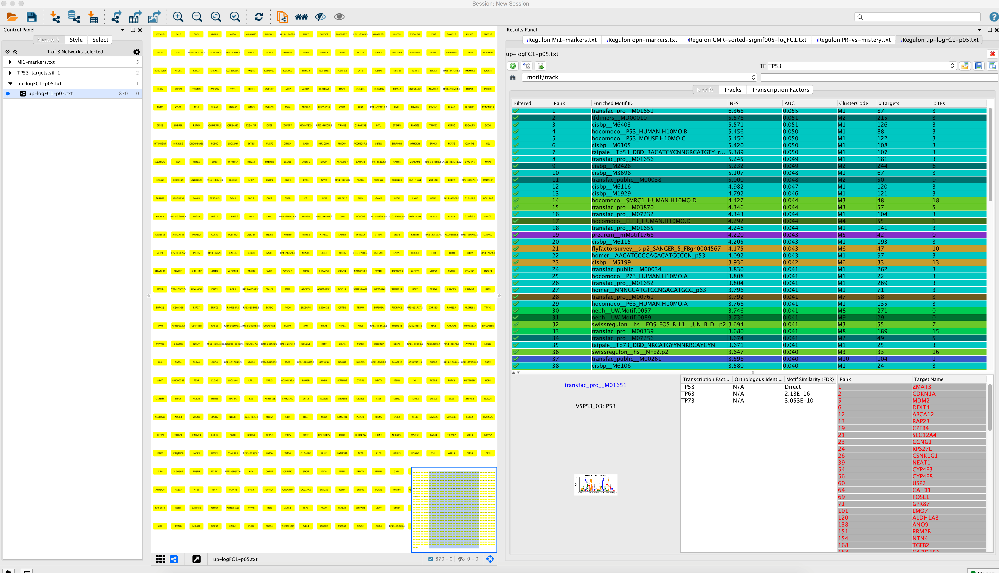

By clicking on the green + button, when a certain motif or TF is active in the right table, the predicted target genes will be connected to the TF by edges. After applying a layout algorithm (Menu-layout), a network of predicted TP53 targets can be obtained:

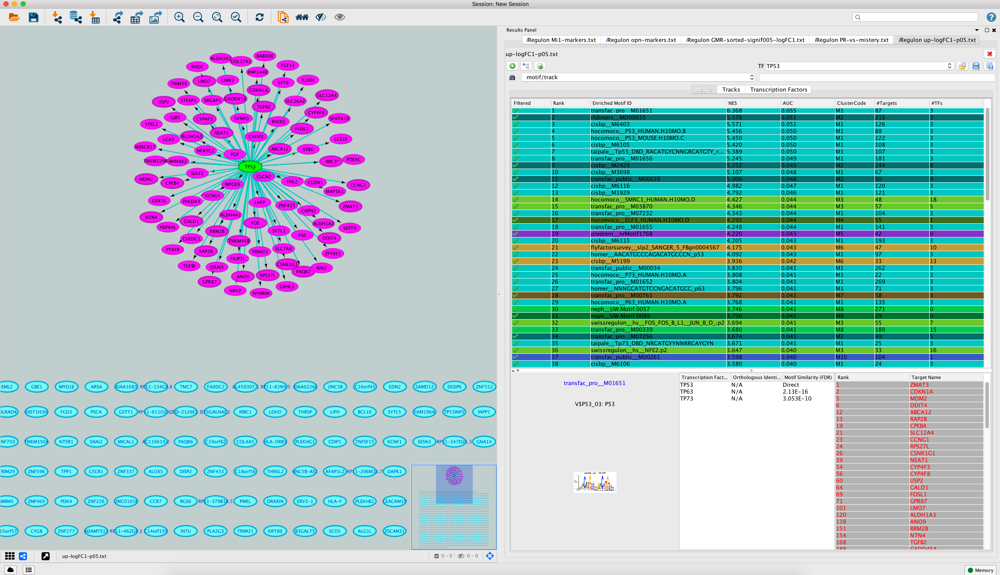